### Import needed packages to wrangle data

In [1]:
import pandas as pd
import requests
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import RegexpTokenizer
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import pandas as pd
import numpy as np

# Clinton vs. Trump Dataset

In [2]:
ClintonTrump = pd.read_csv("C:/Users/deand/Desktop/Courtney/ClintonTrump.csv")
ClintonTrump.head()

,id,handle,text,is_retweet,original_author,time,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,is_quote_status,...,place_type,place_country_code,place_country,place_contained_within,place_attributes,place_bounding_box,source_url,truncated,entities,extended_entities
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,False,NaN,2016-09-28T00:22:34,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Xr...,{'media': [{'display_url': 'pic.twitter.com/Xr...
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",True,timkaine,2016-09-27T23:45:00,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,http://twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/t0...,{'media': [{'display_url': 'pic.twitter.com/t0...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,True,POTUS,2016-09-27T23:26:40,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [{'id_str': '1536791610', 'n...",NaN
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",False,NaN,2016-09-27T23:08:41,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Q3...,{'media': [{'display_url': 'pic.twitter.com/Q3...
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,False,NaN,2016-09-27T22:30:27,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [], 'symbols': [], 'urls': [...",NaN


### Renaming columns

In [3]:
ClintonTrump.rename(columns={'is_retweet':'retweets', 'handle':'username','text':'tweet','entities':'source'},inplace=True)

In [4]:
ClintonTrump.dtypes

id                           int64
username                    object
tweet                       object
retweets                      bool
original_author             object
time                        object
in_reply_to_screen_name     object
in_reply_to_status_id      float64
in_reply_to_user_id        float64
is_quote_status               bool
lang                        object
retweet_count                int64
favorite_count               int64
longitude                  float64
latitude                   float64
place_id                    object
place_full_name             object
place_name                  object
place_type                  object
place_country_code          object
place_country               object
place_contained_within      object
place_attributes            object
place_bounding_box          object
source_url                  object
truncated                     bool
source                      object
extended_entities           object
dtype: object

In [5]:
ClintonTrump['retweets'] = ClintonTrump['retweets'].astype(str)

### Recoding 'retweets' column

In [6]:
def retweets (series):
    if series == "True":
        return 0
    if series == "False":
        return 1

In [7]:
ClintonTrump['retweetsR'] = ClintonTrump['retweets'].apply(retweets)

In [8]:
ClintonTrump.head()

,id,username,tweet,retweets,original_author,time,in_reply_to_screen_name,in_reply_to_status_id,in_reply_to_user_id,is_quote_status,...,place_country_code,place_country,place_contained_within,place_attributes,place_bounding_box,source_url,truncated,source,extended_entities,retweetsR
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,False,NaN,2016-09-28T00:22:34,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Xr...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",True,timkaine,2016-09-27T23:45:00,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,http://twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/t0...,{'media': [{'display_url': 'pic.twitter.com/t0...,0
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,True,POTUS,2016-09-27T23:26:40,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [{'id_str': '1536791610', 'n...",NaN,0
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",False,NaN,2016-09-27T23:08:41,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://studio.twitter.com,False,{'media': [{'display_url': 'pic.twitter.com/Q3...,{'media': [{'display_url': 'pic.twitter.com/Q3...,1
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,False,NaN,2016-09-27T22:30:27,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,https://about.twitter.com/products/tweetdeck,False,"{'user_mentions': [], 'symbols': [], 'urls': [...",NaN,1


### Subsetting data to keep only the necessary columns

In [9]:
ClintonTrump1 = ClintonTrump[['id','username','tweet','time','source','retweetsR','retweet_count']]

In [10]:
ClintonTrump1.head()

,id,username,tweet,time,source,retweetsR,retweet_count
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,2016-09-28T00:22:34,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",2016-09-27T23:45:00,{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,2016-09-27T23:26:40,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",2016-09-27T23:08:41,{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,2016-09-27T22:30:27,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859


### Splitting 'time' column

In [11]:
ClintonTrump2 = ClintonTrump1['time'].str.split('-',expand=True).rename(columns = lambda x: "date"+str(x+1))

In [12]:
ClintonTrump2.head()

,date1,date2,date3
0,2016,09,28T00:22:34
1,2016,09,27T23:45:00
2,2016,09,27T23:26:40
3,2016,09,27T23:08:41
4,2016,09,27T22:30:27


In [13]:
dateTime = ClintonTrump2['date3'].str.split('T',expand=True).rename(columns = lambda x: "time"+str(x+1))
dateTime.head()

,time1,time2
0,28,00:22:34
1,27,23:45:00
2,27,23:26:40
3,27,23:08:41
4,27,22:30:27


In [14]:
ClintonTrump3 = ClintonTrump2[['date1','date2']]

### Adding time and date columns back to original dataframe

In [15]:
ClintonTrump4 = pd.concat([ClintonTrump1,ClintonTrump3,dateTime],axis=1)

In [16]:
ClintonTrump4.head()

,id,username,tweet,time,source,retweetsR,retweet_count,date1,date2,time1,time2
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,2016-09-28T00:22:34,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",2016-09-27T23:45:00,{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,2016-09-27T23:26:40,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",2016-09-27T23:08:41,{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,2016-09-27T22:30:27,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27


### Renaming date and time columns

In [17]:
ClintonTrump5 = ClintonTrump4.rename(columns={'date1':'year','date2':'month','time1':'date','time2':'Time'})

In [18]:
ClintonTrump5 = ClintonTrump5.drop(['time'], axis=1)

### Final version of Clinton vs. Trump dataset

In [19]:
ClintonTrump5.head()

,id,username,tweet,source,retweetsR,retweet_count,year,month,date,Time
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27


# Biden Dataset

In [20]:
Biden = pd.read_csv("C:/Users/deand/Desktop/Courtney/Biden.csv")
Biden.head()

,id,username,timestamp,link,tweet,retweets,likes
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,6551,23058
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",1863,6348
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,14189,56220
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2158,11484
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,38212,164059


### Splitting 'timestamp' column

In [21]:
Biden1 = Biden['timestamp'].str.split('-',expand=True).rename(columns = lambda x: "date"+str(x+1))

In [22]:
Biden1.tail()

,date1,date2,date3
5233,2012,04,09 16:05
5234,2012,04,09 13:25
5235,2012,04,09 13:11
5236,2012,04,09 09:43
5237,2012,04,09 09:42


In [23]:
Biden2 = Biden1['date3'].str.split(' ',expand=True).rename(columns = lambda x: "time"+str(x+1))

In [24]:
Biden2.head()

,time1,time2
0,31,23:59
1,31,23:30
2,31,23:02
3,31,22:23
4,31,18:26


In [25]:
Biden3 = Biden1[['date1','date2']]

### Adding time and date columns back to original dataframe

In [26]:
Biden4 = pd.concat([Biden,Biden3,Biden2],axis=1)

In [27]:
Biden4.head()

,id,username,timestamp,link,tweet,retweets,likes,date1,date2,time1,time2
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,6551,23058,2020,08,31,23:59
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",1863,6348,2020,08,31,23:30
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,14189,56220,2020,08,31,23:02
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2158,11484,2020,08,31,22:23
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,38212,164059,2020,08,31,18:26


### Renaming columns and dropping unneeded columns

In [28]:
Biden5 = Biden4.rename(columns={'date1':'year','date2':'month','time1':'date','time2':'Time','link':'source'})

In [29]:
Biden5 = Biden5.drop(columns=['likes'])

### Duplicating 'retweets' column data into new column

In [30]:
Biden5['retweet_count'] = Biden5['retweets']

### Recoding 'retweets' column

In [31]:
def Retweets (series):
    if series > 0:
        return 0
Biden5['retweetsR'] = Biden5['retweets'].apply(Retweets)

In [32]:
Biden5 = Biden5.drop(columns=['retweets'])

### Final version of Biden dataset

In [33]:
Biden5.head()

,id,username,timestamp,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0


# Appending the dataframes

In [34]:
AllTweets = pd.concat([Biden5, ClintonTrump5], ignore_index=True)

In [35]:
AllTweets.head()

,id,username,timestamp,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0


# Final dataframes

In [36]:
AllTweets

,id,username,timestamp,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0
...,...,...,...,...,...,...,...,...,...,...,...
11677,684219579548041218,realDonaldTrump,NaN,"{'user_mentions': [{'id_str': '26122621', 'nam...","""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,03:47:14,1110,1
11678,684218836569206784,realDonaldTrump,NaN,"{'user_mentions': [{'id_str': '3477455725', 'n...","""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,03:44:17,855,1
11679,684218305100525569,realDonaldTrump,NaN,{'media': [{'display_url': 'pic.twitter.com/JB...,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,03:42:10,2315,1
11680,684217554861199360,realDonaldTrump,NaN,"{'user_mentions': [{'id_str': '42568997', 'nam...","""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,03:39:11,1054,1


### Dropping Colomns I don't need in each Dataset

In [37]:
FinalAllTweets = AllTweets.drop(columns=['source', 'Time', 'timestamp' ])

In [38]:
FinalAllTweets

,id,username,tweet,year,month,date,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0
...,...,...,...,...,...,...,...,...
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,1110,1
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,855,1
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,2315,1
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,1054,1


In [39]:
Biden5

,id,username,timestamp,source,tweet,year,month,date,Time,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,2020-08-31 23:59,https://twitter.com/JoeBiden/status/1300583900...,Donald Trump looks at this violence and sees a...,2020,08,31,23:59,6551,0
1,1300576603295158272,JoeBiden,2020-08-31 23:30,https://twitter.com/JoeBiden/status/1300576603...,"Folks, we're just hours away from our first en...",2020,08,31,23:30,1863,0
2,1300569556382085120,JoeBiden,2020-08-31 23:02,https://twitter.com/JoeBiden/status/1300569556...,The truth is Donald Trump can't stop the viole...,2020,08,31,23:02,14189,0
3,1300559741220016128,JoeBiden,2020-08-31 22:23,https://twitter.com/JoeBiden/status/1300559741...,Anyone who met Amari will tell you that he was...,2020,08,31,22:23,2158,0
4,1300500098233839616,JoeBiden,2020-08-31 18:26,https://twitter.com/JoeBiden/status/1300500098...,More cops have died from COVID this year than ...,2020,08,31,18:26,38212,0
...,...,...,...,...,...,...,...,...,...,...,...
5233,189383473717460992,JoeBiden,2012-04-09 16:05,https://twitter.com/JoeBiden/status/1893834737...,I’m for the Buffett Rule because it just makes...,2012,04,09,16:05,473,0
5234,189343279140184065,JoeBiden,2012-04-09 13:25,https://twitter.com/JoeBiden/status/1893432791...,"In NH on 4/12, the Vice President will give hi...",2012,04,09,13:25,53,0
5235,189339650610036736,JoeBiden,2012-04-09 13:11,https://twitter.com/JoeBiden/status/1893396506...,News for you this morning: VP Biden will speak...,2012,04,09,13:11,54,0
5236,189287350034104320,JoeBiden,2012-04-09 09:43,https://twitter.com/JoeBiden/status/1892873500...,Campaign staff will run this account to keep y...,2012,04,09,09:43,71,0


In [40]:
FinalBiden5 = Biden5.drop(columns=['source', 'timestamp','Time'])

In [41]:
FinalBiden5

,id,username,tweet,year,month,date,retweet_count,retweetsR
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0
...,...,...,...,...,...,...,...,...
5233,189383473717460992,JoeBiden,I’m for the Buffett Rule because it just makes...,2012,04,09,473,0
5234,189343279140184065,JoeBiden,"In NH on 4/12, the Vice President will give hi...",2012,04,09,53,0
5235,189339650610036736,JoeBiden,News for you this morning: VP Biden will speak...,2012,04,09,54,0
5236,189287350034104320,JoeBiden,Campaign staff will run this account to keep y...,2012,04,09,71,0


In [42]:
ClintonTrump5

,id,username,tweet,source,retweetsR,retweet_count,year,month,date,Time
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,{'media': [{'display_url': 'pic.twitter.com/Xr...,1,218,2016,09,28,00:22:34
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",{'media': [{'display_url': 'pic.twitter.com/t0...,0,2445,2016,09,27,23:45:00
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,"{'user_mentions': [{'id_str': '1536791610', 'n...",0,7834,2016,09,27,23:26:40
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",{'media': [{'display_url': 'pic.twitter.com/Q3...,1,916,2016,09,27,23:08:41
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,"{'user_mentions': [], 'symbols': [], 'urls': [...",1,859,2016,09,27,22:30:27
...,...,...,...,...,...,...,...,...,...,...
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...","{'user_mentions': [{'id_str': '26122621', 'nam...",1,1110,2016,01,05,03:47:14
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...","{'user_mentions': [{'id_str': '3477455725', 'n...",1,855,2016,01,05,03:44:17
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",{'media': [{'display_url': 'pic.twitter.com/JB...,1,2315,2016,01,05,03:42:10
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...","{'user_mentions': [{'id_str': '42568997', 'nam...",1,1054,2016,01,05,03:39:11


In [43]:
FinalClintonTrump5 = ClintonTrump5.drop(columns=['Time', 'source'])

In [44]:
FinalClintonTrump5

,id,username,tweet,retweetsR,retweet_count,year,month,date
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016,09,28
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016,09,27
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016,09,27
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016,09,27
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016,09,27
...,...,...,...,...,...,...,...,...
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",1,1110,2016,01,05
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",1,855,2016,01,05
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",1,2315,2016,01,05
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",1,1054,2016,01,05


### Finding the Sample Size

In [45]:
len(FinalAllTweets)

11682

In [46]:
len(FinalBiden5)

5238

In [47]:
len(FinalClintonTrump5)

6444

### Combining month and date

In [48]:
FinalAllTweets["DateR"] = FinalAllTweets["month"] +" "+ FinalAllTweets["year"]

In [49]:
FinalAllTweets

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,08 2020
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,08 2020
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,08 2020
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,08 2020
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,08 2020
...,...,...,...,...,...,...,...,...,...
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,1110,1,01 2016
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,855,1,01 2016
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,2315,1,01 2016
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,1054,1,01 2016


# --------- NLP Sentiment Analysis ----------

### Import Packages 
### Terminal / Anaconda Navigator: conda install -c conda-forge textblob

In [50]:
from textblob import TextBlob
from bs4 import BeautifulSoup
import re
import nltk
import nltk.data
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer,PorterStemmer
from nltk.corpus import stopwords
lemmatizer = WordNetLemmatizer()

### Remove HTML, Emails, Stop Words, Weblinks, Whitespace, Numbers, Special Characters, NAN, and Lowercase Text

In [51]:
 def preprocess(sentence):
    sentence=str(sentence)
    sentence = sentence.lower()
    sentence=sentence.replace('{html}',"") 
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, '', sentence)
    rem_url=re.sub(r'http\S+', '',cleantext)
    rem_num = re.sub('[0-9]+', '', rem_url)
    tokenizer = RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(rem_num)  
    filtered_words = [w for w in tokens if len(w) > 2 if not w in stopwords.words('english')]
    stem_words=[stemmer.stem(w) for w in filtered_words]
    lemma_words=[lemmatizer.lemmatize(w) for w in stem_words]
    return " ".join(filtered_words)
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import TweetTokenizer
stemmer = PorterStemmer() 

### Adding cleanText to all Datasets (FinalAllTweets, Biden and ClintonTrump in That Order)

In [52]:
FinalAllTweets['cleanText']=FinalAllTweets['tweet'].map(lambda s:preprocess(s)) 

In [53]:
FinalBiden5['cleanText']=FinalBiden5['tweet'].map(lambda s:preprocess(s))

In [54]:
FinalClintonTrump5['cleanText']=FinalClintonTrump5['tweet'].map(lambda s:preprocess(s))

In [55]:
FinalAllTweets.head()

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,08 2020,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,08 2020,folks hours away first end month fundraising d...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,08 2020,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,08 2020,anyone met amari tell charismatic young man po...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,08 2020,cops died covid year killed patrol nearly one ...


In [56]:
FinalBiden5.head()

,id,username,tweet,year,month,date,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,folks hours away first end month fundraising d...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,anyone met amari tell charismatic young man po...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,cops died covid year killed patrol nearly one ...


In [57]:
FinalClintonTrump5.head()

,id,username,tweet,retweetsR,retweet_count,year,month,date,cleanText
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016,09,28,question election put plans action make life b...
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016,09,27,last night donald trump said paying taxes smar...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016,09,27,proud hillaryclinton vision command last night...
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016,09,27,stand together nothing make sure ready vote
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016,09,27,candidates asked confront racial injustice one...


### Removing Short Words from cleanText in FinalAllTweets, Biden and ClintonTrump (in that order(

In [58]:
FinalAllTweets['cleanText'] = FinalAllTweets['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalAllTweets.head(10)

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,08 2020,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,08 2020,folks hours away first month fundraising deadl...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,08 2020,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,08 2020,anyone amari tell charismatic young poised gre...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,08 2020,cops died covid year killed patrol nearly smal...
5,1300496925129666561,JoeBiden,"Mr. President, it’s high time you condemn viol...",2020,08,31,11625,0,08 2020,president high time condemn violence form
6,1300495317041729536,JoeBiden,Donald Trump keeps telling us if he was presid...,2020,08,31,59385,0,08 2020,donald trump keeps telling president feel safe...
7,1300494058746458116,JoeBiden,Trump and Pence are running on this: “You won’...,2020,08,31,33740,0,08 2020,trump pence running safe biden america proof v...
8,1300492800161583104,JoeBiden,The simple truth is Donald Trump failed to pro...,2020,08,31,51930,0,08 2020,simple truth donald trump failed protect ameri...
9,1300491542000361473,JoeBiden,"I want a safe America — safe from COVID, safe ...",2020,08,31,17708,0,08 2020,want safe america safe covid safe crime lootin...


In [59]:
FinalBiden5['cleanText'] = FinalBiden5['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalBiden5.head(10)

,id,username,tweet,year,month,date,retweet_count,retweetsR,cleanText
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,donald trump looks violence sees political lif...
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,folks hours away first month fundraising deadl...
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,truth donald trump stop violence years fomente...
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,anyone amari tell charismatic young poised gre...
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,cops died covid year killed patrol nearly smal...
5,1300496925129666561,JoeBiden,"Mr. President, it’s high time you condemn viol...",2020,08,31,11625,0,president high time condemn violence form
6,1300495317041729536,JoeBiden,Donald Trump keeps telling us if he was presid...,2020,08,31,59385,0,donald trump keeps telling president feel safe...
7,1300494058746458116,JoeBiden,Trump and Pence are running on this: “You won’...,2020,08,31,33740,0,trump pence running safe biden america proof v...
8,1300492800161583104,JoeBiden,The simple truth is Donald Trump failed to pro...,2020,08,31,51930,0,simple truth donald trump failed protect ameri...
9,1300491542000361473,JoeBiden,"I want a safe America — safe from COVID, safe ...",2020,08,31,17708,0,want safe america safe covid safe crime lootin...


In [60]:
FinalClintonTrump5['cleanText'] = FinalClintonTrump5['cleanText'].apply(lambda x: ' '.join([w for w in x.split() if len(w)>3]))

FinalClintonTrump5.head(10)

,id,username,tweet,retweetsR,retweet_count,year,month,date,cleanText
0,780925634159796224,HillaryClinton,The question in this election: Who can put the...,1,218,2016,09,28,question election plans action make life better
1,780916180899037184,HillaryClinton,"Last night, Donald Trump said not paying taxes...",0,2445,2016,09,27,last night donald trump said paying taxes smar...
2,780911564857761793,HillaryClinton,Couldn't be more proud of @HillaryClinton. Her...,0,7834,2016,09,27,proud hillaryclinton vision command last night...
3,780907038650068994,HillaryClinton,"If we stand together, there's nothing we can't...",1,916,2016,09,27,stand together nothing make sure ready vote
4,780897419462602752,HillaryClinton,Both candidates were asked about how they'd co...,1,859,2016,09,27,candidates asked confront racial injustice rea...
5,780893126605037568,realDonaldTrump,Join me for a 3pm rally - tomorrow at the Mid-...,1,2181,2016,09,27,join rally tomorrow america center council blu...
6,780883582051123200,HillaryClinton,This election is too important to sit out. Go ...,1,1303,2016,09,27,election important make sure registered nation...
7,780881075891531776,HillaryClinton,When Donald Trump goes low...register to vote:...,1,1833,2016,09,27,donald trump goes register vote
8,780876760086880256,realDonaldTrump,"Once again, we will have a government of, by a...",1,4132,2016,09,27,government people join movement today
9,780874710049550336,HillaryClinton,3) Has Trump offered a single proposal to redu...,0,1087,2016,09,27,trump offered single proposal reduce friction ...


### Tokenize Clean Tweets

In [61]:
tokenizedAllTweets = FinalAllTweets['cleanText'].apply(lambda x: x.split())
tokenizedAllTweets.head()

0    [donald, trump, looks, violence, sees, politic...
1    [folks, hours, away, first, month, fundraising...
2    [truth, donald, trump, stop, violence, years, ...
3    [anyone, amari, tell, charismatic, young, pois...
4    [cops, died, covid, year, killed, patrol, near...
Name: cleanText, dtype: object

In [62]:
tokenizedTweetBiden = FinalBiden5['cleanText'].apply(lambda x: x.split())
tokenizedTweetBiden.head()

0    [donald, trump, looks, violence, sees, politic...
1    [folks, hours, away, first, month, fundraising...
2    [truth, donald, trump, stop, violence, years, ...
3    [anyone, amari, tell, charismatic, young, pois...
4    [cops, died, covid, year, killed, patrol, near...
Name: cleanText, dtype: object

In [63]:
tokenizedTweetClintTrump = FinalClintonTrump5['cleanText'].apply(lambda x: x.split())
tokenizedTweetClintTrump.head()

0    [question, election, plans, action, make, life...
1    [last, night, donald, trump, said, paying, tax...
2    [proud, hillaryclinton, vision, command, last,...
3    [stand, together, nothing, make, sure, ready, ...
4    [candidates, asked, confront, racial, injustic...
Name: cleanText, dtype: object

### Steeming the veggies and making cleanText :)

In [64]:
tokenizedAllTweets = tokenizedAllTweets.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedAllTweets.head()

0    [donald, trump, look, violenc, see, polit, lif...
1    [folk, hour, away, first, month, fundrais, dea...
2    [truth, donald, trump, stop, violenc, year, fo...
3    [anyon, amari, tell, charismat, young, pois, g...
4    [cop, die, covid, year, kill, patrol, nearli, ...
Name: cleanText, dtype: object

In [65]:
tokenizedTweetBiden = tokenizedTweetBiden.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedTweetBiden.head()

0    [donald, trump, look, violenc, see, polit, lif...
1    [folk, hour, away, first, month, fundrais, dea...
2    [truth, donald, trump, stop, violenc, year, fo...
3    [anyon, amari, tell, charismat, young, pois, g...
4    [cop, die, covid, year, kill, patrol, nearli, ...
Name: cleanText, dtype: object

In [162]:
tokenizedTweetClintTrump = tokenizedTweetClintTrump.apply(lambda x: [stemmer.stem(i) for i in x])

tokenizedTweetClintTrump.head(20)

0     [question, elect, plan, action, make, life, be...
1     [last, night, donald, trump, said, pay, tax, s...
2     [proud, hillaryclinton, vision, command, last,...
3        [stand, togeth, noth, make, sure, readi, vote]
4     [candid, ask, confront, racial, injust, real, ...
5     [join, ralli, tomorrow, america, center, counc...
6     [elect, import, make, sure, regist, nationalvo...
7                    [donald, trump, goe, regist, vote]
8                [govern, peopl, join, movement, today]
9     [trump, offer, singl, propo, reduc, friction, ...
10       [elect, week, away, check, regist, vote, take]
11    [nation, voterregistrationday, make, sure, reg...
12    [hillari, clinton, campaign, continu, make, fa...
13    [cnbc, time, magazin, onlin, poll, donald, tru...
14    [donald, trump, lie, american, peopl, least, t...
15    [great, afternoon, littl, havana, hispan, comm...
16    [last, rai, onlin, donat, nation, call, still,...
17    [gain, pound, month, like, eat, machin, tr

# Now, Plotting my Discoveries

## Bar Graphing Tweets

#### All Tweets

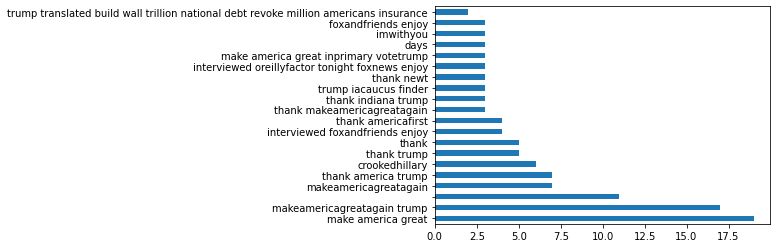

In [67]:
FinalAllTweets['cleanText'].value_counts()[:20].plot(kind='barh')

#### Biden

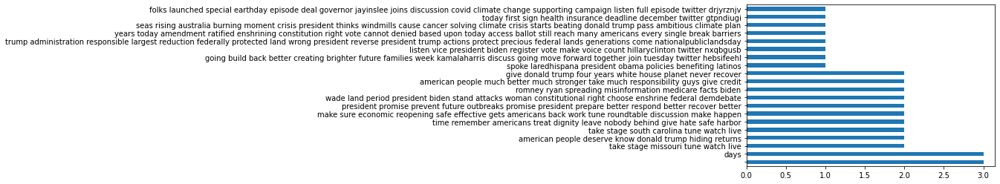

In [68]:
FinalBiden5['cleanText'].value_counts()[:20].plot(kind='barh')

#### Clinton/ Trump

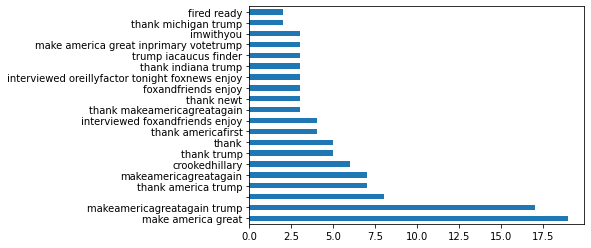

In [69]:
FinalClintonTrump5['cleanText'].value_counts()[:20].plot(kind='barh')

## Polarity and Subjectivity

In [70]:
pol = lambda x: TextBlob(x).sentiment.polarity
sub = lambda x: TextBlob(x).sentiment.subjectivity

### All Tweets Combined

In [71]:
FinalAllTweets['polarity'] = FinalAllTweets['tweet'].apply(pol)
FinalAllTweets['subjectivity'] = FinalAllTweets['tweet'].apply(sub)

In [72]:
FinalAllTweets.tail()

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,1110,1,01 2016,lilredfrmkokomo realdonaldtrump facebook group...,1.000000,0.750000
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,855,1,01 2016,marybnall realdonaldtrump watched lowell mass ...,0.933333,0.833333
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,2315,1,01 2016,ghosthunter_lol iowa endorsement realdonaldtru...,0.000000,1.000000
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,1054,1,01 2016,iloveidevices edwinro happyjack foxnews krauth...,0.000000,0.000000
11681,684216973815844866,realDonaldTrump,"""@SalRiccobono: @realDonaldTrump @troyconway D...",2016,01,05,748,1,01 2016,salriccobono realdonaldtrump troyconway donald...,0.266667,0.283333


### Biden Tweets

In [73]:
FinalBiden5['polarity'] = FinalBiden5['tweet'].apply(pol)
FinalBiden5['subjectivity'] = FinalBiden5['tweet'].apply(sub)

In [74]:
FinalBiden5.tail()

,id,username,tweet,year,month,date,retweet_count,retweetsR,cleanText,polarity,subjectivity
5233,189383473717460992,JoeBiden,I’m for the Buffett Rule because it just makes...,2012,04,09,473,0,buffett rule makes sense like president says c...,0.000,0.000
5234,189343279140184065,JoeBiden,"In NH on 4/12, the Vice President will give hi...",2012,04,09,53,0,vice president give take millionaires lower ra...,0.000,0.000
5235,189339650610036736,JoeBiden,News for you this morning: VP Biden will speak...,2012,04,09,54,0,news morning biden speak exeter fairness presi...,0.000,0.000
5236,189287350034104320,JoeBiden,Campaign staff will run this account to keep y...,2012,04,09,71,0,campaign staff account keep date occasional tw...,0.000,0.125
5237,189287227321356289,JoeBiden,We're excited to announce that @ JoeBiden is b...,2012,04,09,82,0,excited announce joebiden rebooted campaign se...,0.375,0.750


### Clinton/ Trump Tweets

In [75]:
FinalClintonTrump5['polarity'] = FinalClintonTrump5['tweet'].apply(pol)
FinalClintonTrump5['subjectivity'] = FinalClintonTrump5['tweet'].apply(sub)

In [76]:
FinalClintonTrump5.tail()

,id,username,tweet,retweetsR,retweet_count,year,month,date,cleanText,polarity,subjectivity
6439,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",1,1110,2016,01,05,lilredfrmkokomo realdonaldtrump facebook group...,1.000000,0.750000
6440,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",1,855,2016,01,05,marybnall realdonaldtrump watched lowell mass ...,0.933333,0.833333
6441,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",1,2315,2016,01,05,ghosthunter_lol iowa endorsement realdonaldtru...,0.000000,1.000000
6442,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",1,1054,2016,01,05,iloveidevices edwinro happyjack foxnews krauth...,0.000000,0.000000
6443,684216973815844866,realDonaldTrump,"""@SalRiccobono: @realDonaldTrump @troyconway D...",1,748,2016,01,05,salriccobono realdonaldtrump troyconway donald...,0.266667,0.283333


In [77]:
FinalAllTweets.describe()

,id,retweet_count,retweetsR,polarity,subjectivity
count,1.168200e+04,11682.000000,11682.000000,11682.000000,11682.000000
mean,8.702333e+17,4618.046054,0.489813,0.126911,0.368507
std,2.830693e+17,9798.824881,0.499918,0.297972,0.299820
min,1.892872e+17,1.000000,0.000000,-1.000000,0.000000
25%,7.288195e+17,819.250000,0.000000,0.000000,0.000000
50%,7.631107e+17,2248.500000,0.000000,0.010764,0.383631
75%,1.175032e+18,5354.750000,1.000000,0.275000,0.571354
max,1.300584e+18,490180.000000,1.000000,1.000000,1.000000


In [78]:
FinalAllTweets.tail()

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity
11677,684219579548041218,realDonaldTrump,"""@lilredfrmkokomo: @realDonaldTrump My Faceboo...",2016,01,05,1110,1,01 2016,lilredfrmkokomo realdonaldtrump facebook group...,1.000000,0.750000
11678,684218836569206784,realDonaldTrump,"""@marybnall01: @realDonaldTrump watched lowell...",2016,01,05,855,1,01 2016,marybnall realdonaldtrump watched lowell mass ...,0.933333,0.833333
11679,684218305100525569,realDonaldTrump,"""@ghosthunter_lol: Iowa key endorsement for @r...",2016,01,05,2315,1,01 2016,ghosthunter_lol iowa endorsement realdonaldtru...,0.000000,1.000000
11680,684217554861199360,realDonaldTrump,"""@iLoveiDevices: @EdwinRo47796972 @happyjack22...",2016,01,05,1054,1,01 2016,iloveidevices edwinro happyjack foxnews krauth...,0.000000,0.000000
11681,684216973815844866,realDonaldTrump,"""@SalRiccobono: @realDonaldTrump @troyconway D...",2016,01,05,748,1,01 2016,salriccobono realdonaldtrump troyconway donald...,0.266667,0.283333


In [79]:
FinalAllTweets.dtypes

id                 int64
username          object
tweet             object
year              object
month             object
date              object
retweet_count      int64
retweetsR          int64
DateR             object
cleanText         object
polarity         float64
subjectivity     float64
dtype: object

### Polarity V Subjectivity Scatter Plots 

#### Clinton/ Trump

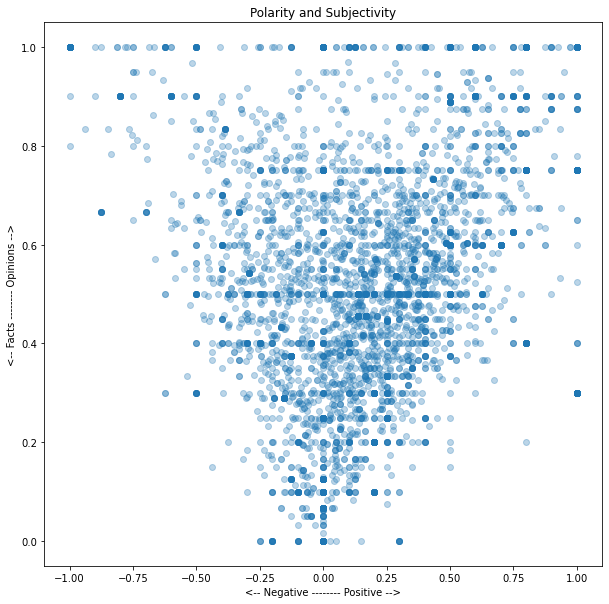

In [207]:
x = FinalClintonTrump5.polarity
y = FinalClintonTrump5.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')
plt.rcParams["figure.figsize"]=10,20



plt.show()

#### Biden

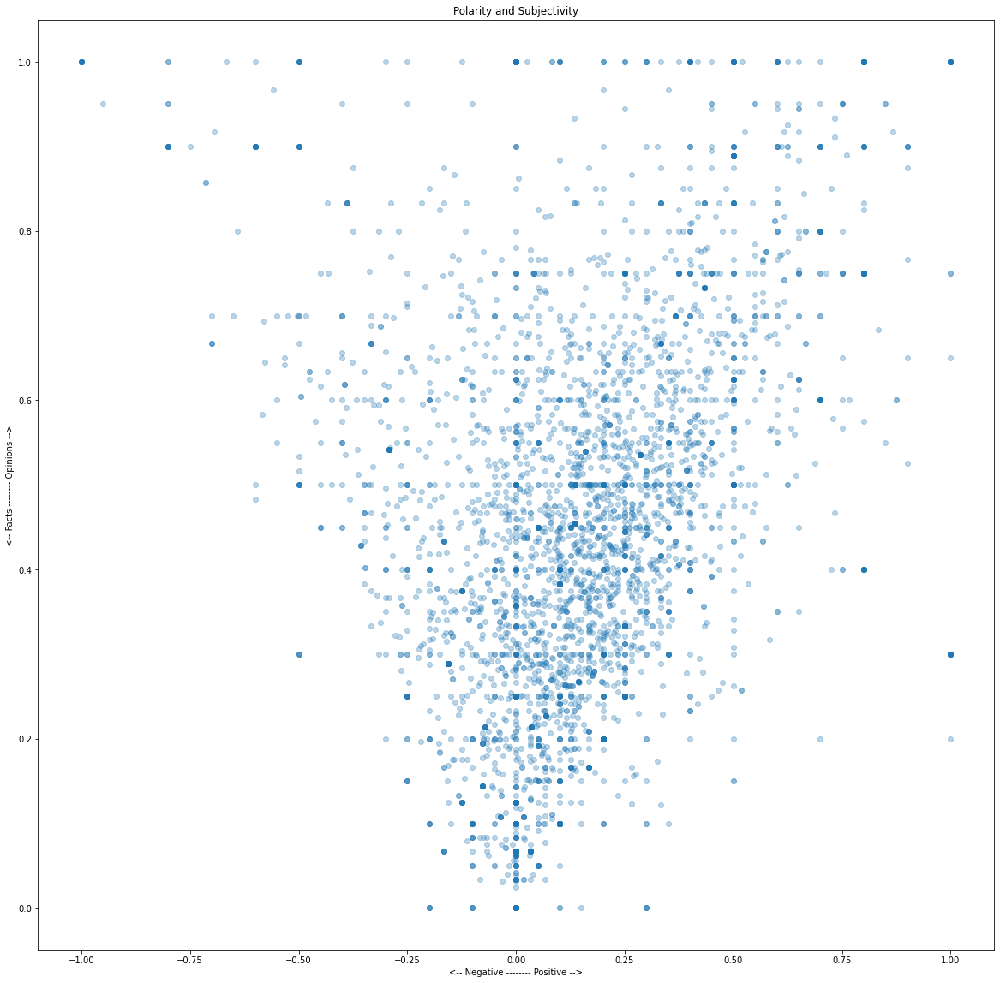

In [160]:
x = FinalBiden5.polarity
y = FinalBiden5.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')
plt.rcParams["figure.figsize"]=15,20


plt.show()

#### All Tweets

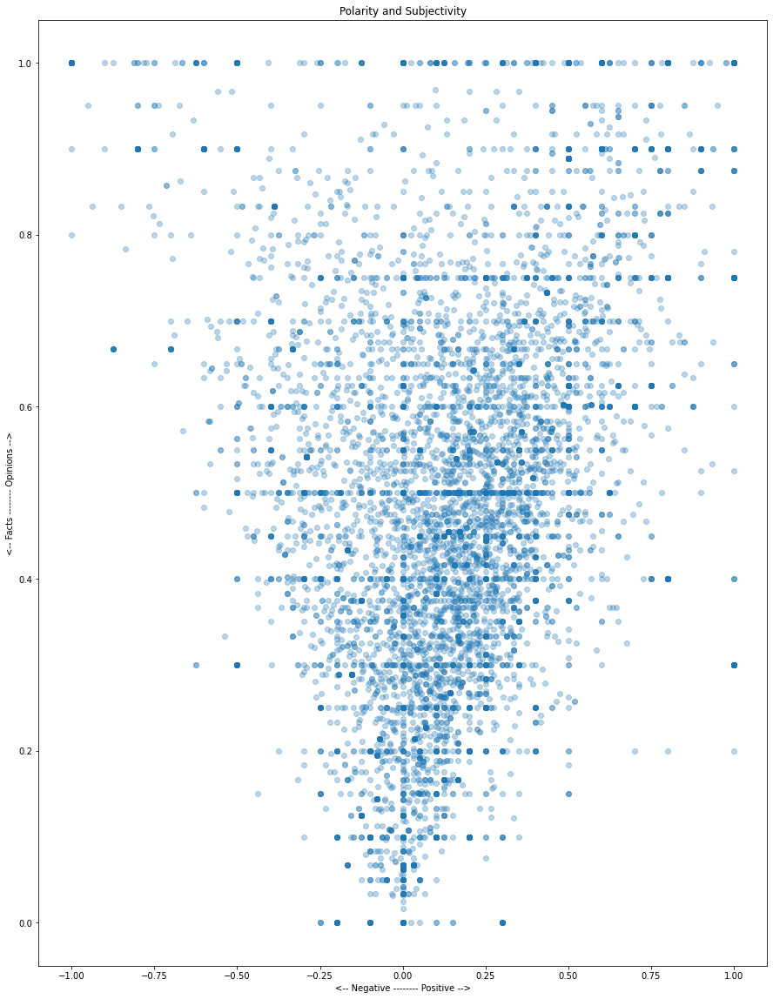

In [161]:
x = FinalAllTweets.polarity
y = FinalAllTweets.subjectivity
fig, ax = plt.subplots()


ax.scatter(x, y, alpha=0.3, cmap = 'viridis')
ax.set_title('Polarity and Subjectivity')
ax.set_xlabel('<-- Negative -------- Positive -->')
ax.set_ylabel('<-- Facts -------- Opinions -->')
plt.rcParams["figure.figsize"]=50,50


plt.show()

### Making a Word Cloud for Retweets (with Twitter symbol)

#### Import Packages 

In [83]:
from wordcloud import WordCloud,ImageColorGenerator
from PIL import Image
import urllib
import requests

In [84]:
allRetweets = ' '.join(text for text in FinalAllTweets['cleanText'][FinalAllTweets['retweetsR']==1])

#### combinig the image with the dataset

In [85]:
Mask = np.array(Image.open(requests.get('http://clipart-library.com/image_gallery2/Twitter-PNG-Image.png', stream=True).raw))

#### We use the ImageColorGenerator library from Wordcloud 
#### Here we take the color of the image and impose it over our wordcloud

In [86]:
image_colors = ImageColorGenerator(Mask)

#### Now we use the WordCloud function from the wordcloud library 

In [165]:
wc = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allRetweets)

## Plotting Word Cloud with cleanText using retweetR

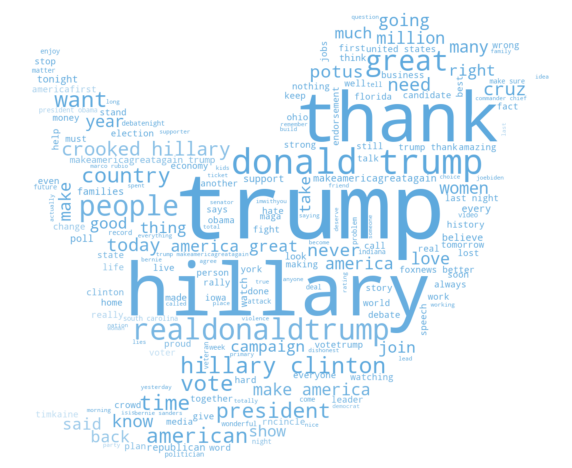

In [166]:
plt.figure(figsize=(10,20))

plt.imshow(wc.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

#### FinalAllTweets Dataset

In [89]:
allRetweets1 = ' '.join(text for text in FinalAllTweets['cleanText'][FinalAllTweets['retweetsR']==0])

In [163]:
wc1 = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allRetweets1)


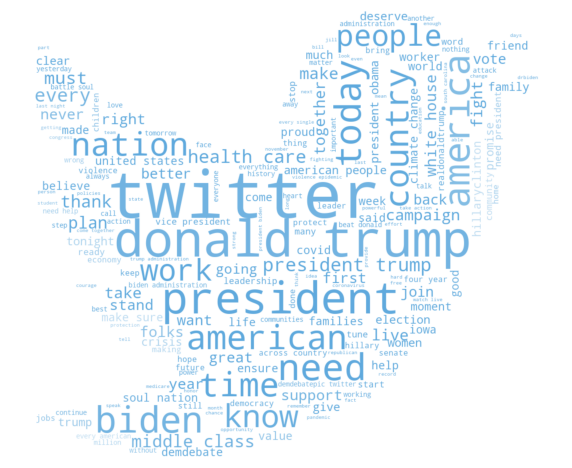

In [164]:
plt.figure(figsize=(10,20))

plt.imshow(wc1.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

#### Clinton/Trump Dataset

In [92]:
allRetweetsClintTrump = ' '.join(text for text in FinalClintonTrump5['cleanText'][FinalClintonTrump5['retweetsR']==1])

In [167]:
wcClintTrump = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allRetweetsClintTrump)


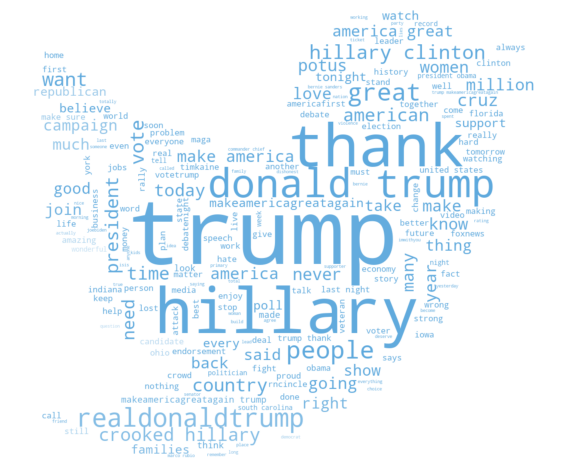

In [168]:
plt.figure(figsize=(10,20))

plt.imshow(wcClintTrump.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

#### switched up the count on ClintonTrump -------------

In [172]:
allRetweetsClintTrump1 = ' '.join(text for text in FinalClintonTrump5['cleanText'][FinalClintonTrump5['retweetsR']==1])

In [173]:
wcClintTrump1 = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allRetweetsClintTrump1)


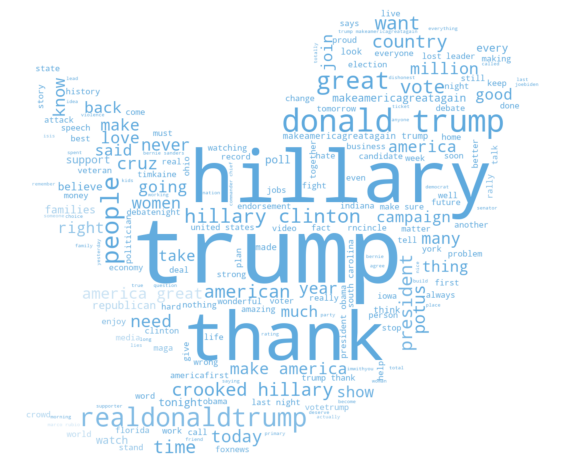

In [174]:
plt.figure(figsize=(10,20))

plt.imshow(wcClintTrump1.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

#### Biden Dataset

In [98]:
allRetweetsBiden = ' '.join(text for text in FinalBiden5['cleanText'][FinalBiden5['retweetsR']==0])

In [175]:
wcBiden = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allRetweetsBiden)


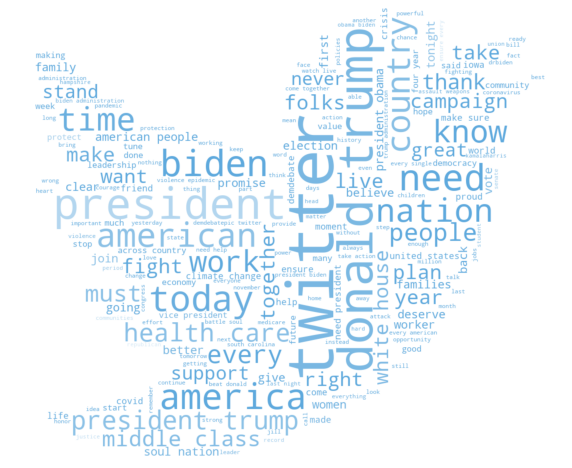

In [176]:
plt.figure(figsize=(10,20))

plt.imshow(wcBiden.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

### extract pos and neg hashtags from  combined tweets 

In [101]:
def Hashtags_Extract(x):
    hashtags=[]
    
  
    for i in x:
        ht = re.findall(r'#(\w+)',i)
        hashtags.append(ht)
    
    return hashtags

#### Extracting all Positive Hashtags

In [102]:
positiveAllTweets = Hashtags_Extract(FinalAllTweets['tweet'][FinalAllTweets['retweetsR']==0])

positiveAllTweets

[[],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],


#### Leaving the Empty Fields Behind/ Positive

In [103]:
positiveUnnestAll = sum(positiveAllTweets,[])

positiveUnnestAll

['click',
 'tracking',
 'click',
 '2',
 'VoterRegistrationDay',
 'MakeAmericaGreatAgain',
 'Debates2016',
 'NationalVoterRegistrationDay',
 'iRegistered',
 'NationalVoterRegistrationDay',
 'debatenight',
 'debatenight',
 'ImWithHer',
 'debatenight',
 'debate',
 'Debates2016',
 'debate',
 'DebateNight',
 'Debate',
 'MAGA',
 'Debates2016',
 'debate',
 'debate',
 'Debates2016',
 'Polls',
 'slipping',
 'Debates2016',
 'DebateNight',
 'DeclareYourAmbition',
 'ADA',
 'imwithher',
 'CripTheVote',
 'UNGA',
 'polls',
 'HispanicHeritageMonth',
 'HispanicHeritageMonth',
 'LibrarianOfCongress',
 'WeTrumpHate',
 'election2016',
 'MakeAmericaGreatAgain',
 'MAGA',
 'TrumpTrain',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'NBCNewsForum',
 'TrumpPence16',
 'TrumpinEverett',
 'RIP',
 'JuanGabriel',
 'DivoDeJuarez',
 'GoodTrouble',
 'StrongerTogether',
 'StrongerTogether',
 'WomensEqualityDay',
 'NPS100',
 'NPS100',
 'ImWithHer',
 'Diwali',
 'LAflood',
 'smallbiz',
 'WHD',
 'Ros

#### Extracting all Negative Hashtags

In [104]:
negativeAllTweet = Hashtags_Extract(FinalAllTweets['tweet'][FinalAllTweets['retweetsR']==1])

negativeAllTweet

[[],
 [],
 [],
 [],
 ['NationalVoterRegistrationDay'],
 [],
 [],
 [],
 ['MAGA'],
 [],
 ['ImWithYou'],
 ['MAGA'],
 [],
 ['NationalVoterRegistrationDay'],
 ['LoveTrumpsHate'],
 ['StrongerTogether'],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 [],
 ['NationalVoterRegistrationDay'],
 ['NationalVoterRegistrationDay'],
 [],
 ['MAGA'],
 ['SheWon'],
 [],
 ['SheWon'],
 ['AmericaFirst', 'MAGA', 'ImWithYou'],
 ['NationalVoterRegistrationDay'],
 [],
 [],
 ['SheWon'],
 [],
 ['SheWon'],
 ['TrumpWon', 'MAGA'],
 [],
 [],
 [],
 ['1', 'TrumpWon'],
 [],
 [],
 [],
 ['SheWon'],
 [],
 [],
 ['DebateNight'],
 ['MAGA'],
 ['DebateNight', 'AmericaFirst', 'ImWithYou'],
 ['DebateNight', 'AmericaFirst', 'MAGA'],
 [],
 [],
 ['DebateNight'],
 ['AmericaFirst', 'Debates2016'],
 ['AmericaFirst'],
 ['Debates2016', 'MAGA'],
 ['DebateNight'],
 ['DebateNight'],
 [],
 ['debatenight'],
 ['debatenight'],
 [],
 ['DebateNight'],
 ['Benghazi', 'Debates2016', 'debatenight'],
 ['debatenight'],
 ['debatenight'],
 ['ISIS', 'DebateNight'],
 [

#### Leaving the Empty Fields Behind/ Negative

In [105]:
negativeUnnestAll = sum(negativeAllTweet,[])
negativeUnnestAll

['NationalVoterRegistrationDay',
 'MAGA',
 'ImWithYou',
 'MAGA',
 'NationalVoterRegistrationDay',
 'LoveTrumpsHate',
 'StrongerTogether',
 'NationalVoterRegistrationDay',
 'NationalVoterRegistrationDay',
 'MAGA',
 'SheWon',
 'SheWon',
 'AmericaFirst',
 'MAGA',
 'ImWithYou',
 'NationalVoterRegistrationDay',
 'SheWon',
 'SheWon',
 'TrumpWon',
 'MAGA',
 '1',
 'TrumpWon',
 'SheWon',
 'DebateNight',
 'MAGA',
 'DebateNight',
 'AmericaFirst',
 'ImWithYou',
 'DebateNight',
 'AmericaFirst',
 'MAGA',
 'DebateNight',
 'AmericaFirst',
 'Debates2016',
 'AmericaFirst',
 'Debates2016',
 'MAGA',
 'DebateNight',
 'DebateNight',
 'debatenight',
 'debatenight',
 'DebateNight',
 'Benghazi',
 'Debates2016',
 'debatenight',
 'debatenight',
 'debatenight',
 'ISIS',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'Debates2016',
 'MAGA',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'debatenight',
 'DebateNight',
 'DebateNight',
 'debatenight'

### Counting Frequency of Positive Hashtags Then Graphing

In [106]:
positiveFreqAll = nltk.FreqDist(positiveUnnestAll)

positiveFreqAll

FreqDist({'ImWithHer': 17, 'RNCinCLE': 12, 'DemsInPhilly': 11, 'MakeAmericaGreatAgain': 10, 'NoBillNoBreak': 9, 'Trump2016': 8, 'TrumpTrain': 6, 'DemConvention': 6, 'Debates2016': 5, 'NBCNewsForum': 5, ...})

#### Putting Positive Hashtags and the Count in a Dataframe

In [107]:
positiveDF = pd.DataFrame({'Hashtags':list(positiveFreqAll.keys()),'Count':list(positiveFreqAll.values())})

positiveDF.head(15)

,Hashtags,Count
0,click,2
1,tracking,1
2,2,1
3,VoterRegistrationDay,1
4,MakeAmericaGreatAgain,10
5,Debates2016,5
6,NationalVoterRegistrationDay,2
7,iRegistered,1
8,debatenight,3
9,ImWithHer,17


In [108]:
positiveDF['Hashtags'].value_counts(ascending=True)

imwithher               1
EarthDay                1
MikePence               1
ADA                     1
TrumpLV                 1
                       ..
PurpleHeartDay          1
MichaelBrown            1
VoterRegistrationDay    1
WeTrumpHate             1
StoptheHate             1
Name: Hashtags, Length: 171, dtype: int64

#### Graphing Positive Hashtags by Count

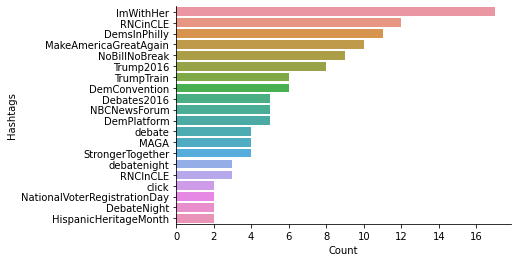

In [109]:
positivePlotAll = positiveDF.nlargest(20,columns='Count')

sns.barplot(data=positivePlotAll,y='Hashtags',x='Count')
sns.despine()

### Now, Doing the Same for Negative

#### Counting Negative Frequency

In [110]:
negativeFreqAll = nltk.FreqDist(negativeUnnestAll)

negativeFreqAll

FreqDist({'Trump2016': 336, 'MakeAmericaGreatAgain': 240, 'VoteTrump': 67, 'AmericaFirst': 66, 'MAGA': 56, 'ImWithYou': 55, 'RNCinCLE': 51, 'DemsInPhilly': 40, 'DebateNight': 32, 'TrumpTrain': 30, ...})

#### Putting the Hashtags and Count into a Dataframe

In [154]:
negativeDF = pd.DataFrame({'Hashtags':list(negativeFreqAll.keys()),'Count':list(negativeFreqAll.values())})

negativeDF['Hashtags'].value_counts(ascending=True)

SouthCarolinaPrimary    1
Laurence                1
Bush                    1
SOTU                    1
ROGERAILES              1
                       ..
UtahPrimary             1
IowaCaucus              1
IAPolitics              1
RepMikeKelly            1
DonaldTrump             1
Name: Hashtags, Length: 331, dtype: int64

#### Graphing the Negative Hashtags by Count

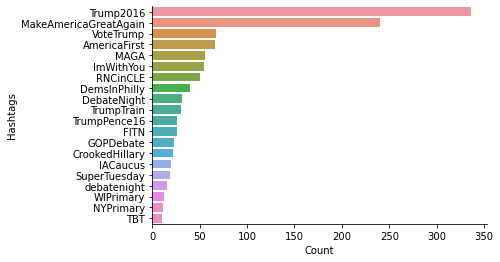

In [112]:
negativePlotAll = negativeDF.nlargest(20,columns='Count')

sns.barplot(data=negativePlotAll,y='Hashtags',x='Count')
sns.despine()

### Adding Positive and Negative Hashtags into FinalAllTweets Dataframe 

In [113]:
PosFinalAllHashtags = pd.concat([FinalAllTweets, positiveDF],axis=1)

In [114]:
PosFinalAllHashtags.head()

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity,Hashtags,Count
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,08 2020,donald trump looks violence sees political lif...,-0.250000,0.200000,click,2.0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,08 2020,folks hours away first month fundraising deadl...,0.400000,0.464583,tracking,1.0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,08 2020,truth donald trump stop violence years fomente...,0.000000,0.000000,2,1.0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,08 2020,anyone amari tell charismatic young poised gre...,0.262500,0.662500,VoterRegistrationDay,1.0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,08 2020,cops died covid year killed patrol nearly smal...,0.041667,0.266667,MakeAmericaGreatAgain,10.0


In [115]:
NegFinalAllHashtags = pd.concat([FinalAllTweets, negativeDF],axis=1)

In [116]:
NegFinalAllHashtags.head(10)

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity,Hashtags,Count
0,1300583900503183360,JoeBiden,Donald Trump looks at this violence and sees a...,2020,08,31,6551,0,08 2020,donald trump looks violence sees political lif...,-0.250000,0.200000,NationalVoterRegistrationDay,5.0
1,1300576603295158272,JoeBiden,"Folks, we're just hours away from our first en...",2020,08,31,1863,0,08 2020,folks hours away first month fundraising deadl...,0.400000,0.464583,MAGA,56.0
2,1300569556382085120,JoeBiden,The truth is Donald Trump can't stop the viole...,2020,08,31,14189,0,08 2020,truth donald trump stop violence years fomente...,0.000000,0.000000,ImWithYou,55.0
3,1300559741220016128,JoeBiden,Anyone who met Amari will tell you that he was...,2020,08,31,2158,0,08 2020,anyone amari tell charismatic young poised gre...,0.262500,0.662500,LoveTrumpsHate,5.0
4,1300500098233839616,JoeBiden,More cops have died from COVID this year than ...,2020,08,31,38212,0,08 2020,cops died covid year killed patrol nearly smal...,0.041667,0.266667,StrongerTogether,3.0
5,1300496925129666561,JoeBiden,"Mr. President, it’s high time you condemn viol...",2020,08,31,11625,0,08 2020,president high time condemn violence form,0.160000,0.540000,SheWon,5.0
6,1300495317041729536,JoeBiden,Donald Trump keeps telling us if he was presid...,2020,08,31,59385,0,08 2020,donald trump keeps telling president feel safe...,0.500000,0.500000,AmericaFirst,66.0
7,1300494058746458116,JoeBiden,Trump and Pence are running on this: “You won’...,2020,08,31,33740,0,08 2020,trump pence running safe biden america proof v...,0.500000,0.500000,TrumpWon,2.0
8,1300492800161583104,JoeBiden,The simple truth is Donald Trump failed to pro...,2020,08,31,51930,0,08 2020,simple truth donald trump failed protect ameri...,-0.250000,0.328571,1,5.0
9,1300491542000361473,JoeBiden,"I want a safe America — safe from COVID, safe ...",2020,08,31,17708,0,08 2020,want safe america safe covid safe crime lootin...,0.322222,0.505556,DebateNight,32.0


In [117]:
NFAHDrop = NegFinalAllHashtags.dropna()

In [118]:
NFAHDrop.tail(10)

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity,Hashtags,Count
321,1290383185432305666,JoeBiden,In the days that followed the El Paso shooting...,2020,08,03,3057,0,08 2020,days followed paso shooting said americans com...,-0.075000,0.775000,IAPolitics,1.0
322,1290350721515139072,JoeBiden,"It's hard to believe this has to be said, but ...",2020,08,03,28314,0,08 2020,hard believe said elected president spend mond...,0.236111,0.680556,SOTU,2.0
323,1290337132339486722,JoeBiden,This is a moment to summon the purpose we felt...,2020,08,03,7820,0,08 2020,moment summon purpose felt year paso moment re...,0.411111,0.411111,GoldenGlobe,1.0
324,1290311966247006209,JoeBiden,"One year ago, a white supremacist armed with a...",2020,08,03,8897,0,08 2020,year white supremacist armed semi automatic ri...,0.266667,0.500000,Laurence,1.0
325,1290071129172791296,JoeBiden,"Folks, there's simply too much at stake this N...",2020,08,02,15074,0,08 2020,folks simply much stake november anyone sideli...,0.100000,0.278571,Dem,1.0
326,1290031870596403200,JoeBiden,"Welcome home, Bob and Doug! The first American...",2020,08,02,8756,0,08 2020,welcome home doug first american splashdown ye...,0.333333,0.363889,Rubio,1.0
327,1290030423951646720,JoeBiden,Join us as we host a roundtable with Congressw...,2020,08,02,1759,0,08 2020,join host roundtable congresswoman veronica es...,0.000000,0.000000,Bush,1.0
328,1289999407979454465,JoeBiden,It’s not enough to just go back to the way thi...,2020,08,02,14829,0,08 2020,enough back things crises need build back bett...,0.167045,0.325568,DavidCameron,1.0
329,1289964174575976449,JoeBiden,"Now more than ever, we need a president who be...",2020,08,02,32729,0,08 2020,ever need president believes science,0.500000,0.500000,WH,1.0
330,1289932717417734144,JoeBiden,This pandemic has put a bright light on the di...,2020,08,02,7415,0,08 2020,pandemic bright light disparities plagued nati...,0.360000,0.624444,Trump4President,1.0


In [119]:
PFAHDrop = PosFinalAllHashtags.dropna()

In [120]:
PFAHDrop.tail()

,id,username,tweet,year,month,date,retweet_count,retweetsR,DateR,cleanText,polarity,subjectivity,Hashtags,Count
166,1295887792078065665,JoeBiden,"Last night, folks from across the country came...",2020,08,19,2159,0,08 2020,last night folks across country came together ...,0.233333,0.422222,VoteTrump2016,1.0
167,1295864301845123073,JoeBiden,We're in a battle for the soul of this nation....,2020,08,18,5528,0,08 2020,battle soul nation stand want stake beat donal...,0.000000,0.000000,CruzCrew,1.0
168,1295828315056623616,JoeBiden,Be a patriot. Protect your fellow citizens. We...,2020,08,18,32883,0,08 2020,patriot protect fellow citizens wear mask,0.000000,0.000000,NewYork,1.0
169,1295786288826601472,JoeBiden,Our nation was founded on a simple idea: All m...,2020,08,18,10332,0,08 2020,nation founded simple idea women created equal...,0.166667,0.498677,Jonas,1.0
170,1295759864648609795,JoeBiden,Donald Trump still doesn’t have a plan to get ...,2020,08,18,6748,0,08 2020,donald trump still plan virus control failure ...,-0.158333,0.150000,NewYorkValues,1.0


### Now, to do Hashtags in a Word Cloud 

#### Positive Hashtags Word Cloud

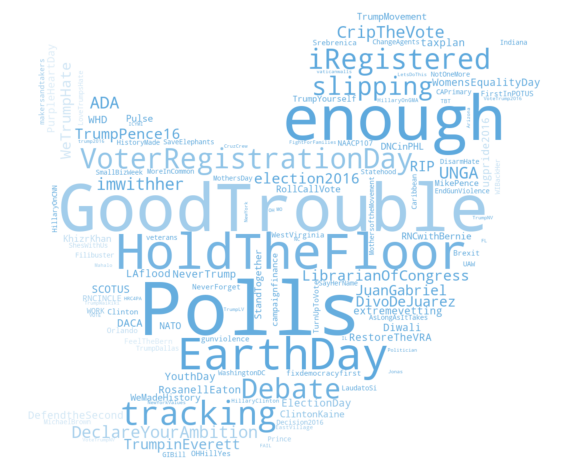

In [182]:
allHashtagsPos = ' '.join(text for text in PosFinalAllHashtags['Hashtags'][PosFinalAllHashtags['Count']==1])
wcHashtagsPos = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allHashtagsPos)
plt.figure(figsize=(10,20))

plt.imshow(wcHashtagsPos.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

#### Negative Hashtags Word Cloud

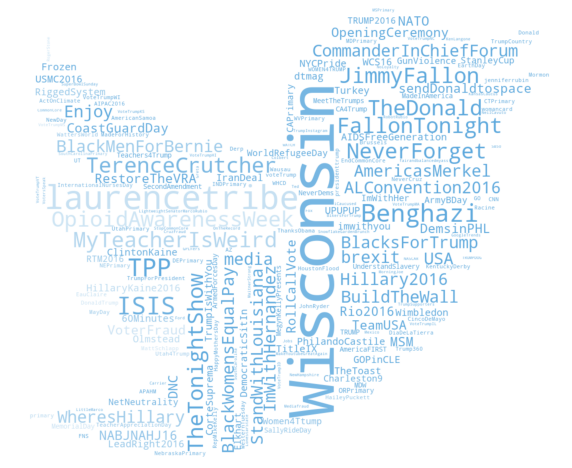

In [183]:
allHashtagsNeg = ' '.join(text for text in NegFinalAllHashtags['Hashtags'][NegFinalAllHashtags['Count']==1])
wcHashtagsNeg = WordCloud(background_color='white', height=1500, width=4000,mask=Mask).generate(allHashtagsNeg)
plt.figure(figsize=(10,20))

plt.imshow(wcHashtagsNeg.recolor(color_func=image_colors),interpolation="hamming")

plt.axis('off')
plt.show()

## Hovering Scatterplot - Polarity and Subjectivity w/ Biden, Clinton and Trump compared by retweet count

### Import Packages 

In [121]:
import plotly
import plotly.express as px

In [122]:
df = px.data.gapminder()
fig = px.scatter(FinalAllTweets, x="polarity", y="subjectivity", size="retweet_count", color="username",
           hover_name="cleanText", log_x=True, size_max=80)
fig.show()

## Polarity and Subjectivity side by side with Clinton and Trump in 3D Scatter Plot

In [125]:
df = px.data.gapminder()
fig = px.scatter(FinalClintonTrump5, "polarity", y="subjectivity", animation_frame="year", animation_group="tweet",
           size="retweet_count", color="username", hover_name="cleanText", facet_col="username",
           log_x=True, size_max=80, range_x=[1,1], range_y=[1,1])
fig.show()

## Negative and Positive Hashtags in a 3D Scatter Plot

In [151]:
df = px.data.gapminder()
fig = px.scatter(NFAHDrop, x="Count", y="Hashtags", animation_group="tweet",
           size="Count", color="Hashtags", hover_name="Hashtags", 
           log_x=True, size_max=100, range_x=[500,1], range_y=[500,50])
fig.show()

In [123]:
df = px.data.gapminder()
fig = px.scatter(PFAHDrop, x="Count", y="Hashtags", animation_group="tweet",
           size="Count", color="Hashtags", hover_name="Hashtags", facet_col="username",
           log_x=True, size_max=100, range_x=[500,1], range_y=[500,50])
fig.show()

## Trying out API

### importing packages 

In [126]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections

import tweepy as tw
import nltk
from nltk.corpus import stopwords
import re
import networkx


### Gaining Access to my Consumer Keys and Access Tokens to Pull Tweets From Twitter Using API

In [127]:
consumerKey = "w4pKhVvWCjCbY32tNmzCimIJj"
consumerSecret = "jqjiVlfRBe3n03xJZtgY6suqMVNGqzjjYiSTYoADkdm0AwVaaW"
accessToken = "1301574480037392390-2yrsX3PY1wlHHeQjfWuLAILXjhMl82"
accessTokenSecret = "IeIMX7ub7VxgD44ProDrLIx9PlqSgbaq4iRqHxL2fk48c"

In [128]:
auth = tw.OAuthHandler(consumerKey, consumerSecret)
auth.set_access_token(accessToken, accessTokenSecret)
api = tw.API(auth, wait_on_rate_limit=True)

### Looking for Joe Biden Tweets from Twitter using API

In [141]:
search_term = "@JoeBiden"

tweets = tw.Cursor(api.search,
                   q=search_term,
                   lang="en",
                   since='2012-01-01').items(1000)

allTweetsBiden6 = [tweet.text for tweet in tweets]

allTweetsBiden6[:10]

['RT @KaivanShroff: 🚨BREAKING: @JoeBiden has officially received more votes for president of the United States than any candidate in History.…',
 'RT @joncoopertweets: If @JoeBiden wins these four states, where he’s currently leading, he’ll be our next president.\n#CountEveryVote #Biden…',
 "RT @JoeBiden: It's not my place or Donald Trump's place to declare the winner of this election. It's the voters' place.",
 "RT @JoeBiden: It's not my place or Donald Trump's place to declare the winner of this election. It's the voters' place.",
 '@Pantherchap2 @evanasmith @JoeBiden your desire for an investigation is based on your hypothesis that those countie… https://t.co/elqKhhz8SV',
 '@SteveSchmidtSES @realDonaldTrump @JoeBiden I hope to God you are correct Steve.',
 'America needs an early Christmas Present. @JoeBiden HAS to win.',
 'The Hispanic community in Fla has shown they are against @JoeBiden and socialism and the black communities should h… https://t.co/1kSjDtaHhF',
 '@Scaramucci @cin

#### Remove URLS

In [130]:
def removeUrl(txt):
    """Replace URLs found in a text string with nothing 
    (i.e. it will remove the URL from the string).

    Parameters
    ----------
    txt : string
        A text string that you want to parse and remove urls.

    Returns
    -------
    The same txt string with url's removed.
    """

    return " ".join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", "", txt).split())

In [131]:
allTweetsNoURLS = [removeUrl(tweet) for tweet in allTweetsBiden6]
allTweetsNoURLS[:10]

['RT JoeBiden We feel good about where we are We believe we are on track to win this election',
 'RT JoeBiden We feel good about where we are We believe we are on track to win this election',
 'RT FrankieMcLister If youre waking up in BattlegroundAZ heres what you need to knowAP calls VP JoeBiden as AZ winner Prop 207',
 'repsbutterfly JoeBiden realDonaldTrump wbk Biden closing in on his first diamond record',
 'RT YNB Anybody burnt that JoeBiden may win a place like Nevada with just a 76000 vote lead remember that realDonaldTrump won the PR',
 'RT JoeBiden We wont rest until everyones vote is counted Tune in as my campaign manager jomalleydillon and campaign adviser Bob Bauer',
 'DavidPh32074764 BernardKerik johncardillo JoeBiden realDonaldTrump Half the country was disgusted with what th',
 'RT KaivanShroff BREAKING JoeBiden has officially received more votes for president of the United States than any candidate in History',
 'RT KaivanShroff BREAKING JoeBiden has officially received

#### Text Cleanup

In [132]:
allTweetsNoURLS[0].split()

['RT',
 'JoeBiden',
 'We',
 'feel',
 'good',
 'about',
 'where',
 'we',
 'are',
 'We',
 'believe',
 'we',
 'are',
 'on',
 'track',
 'to',
 'win',
 'this',
 'election']

In [133]:
allTweetsNoURLS[0].lower().split()

['rt',
 'joebiden',
 'we',
 'feel',
 'good',
 'about',
 'where',
 'we',
 'are',
 'we',
 'believe',
 'we',
 'are',
 'on',
 'track',
 'to',
 'win',
 'this',
 'election']

In [134]:
stopWords = set(stopwords.words('english'))


list(stopWords)[0:10]

['wasn',
 'i',
 'because',
 'such',
 'on',
 'any',
 'needn',
 'each',
 'only',
 "couldn't"]

### Calculate and Plot word Freq

In [135]:
wordsTweets = [tweet.lower().split() for tweet in allTweetsNoURLS]
wordsTweets[:2]

[['rt',
  'joebiden',
  'we',
  'feel',
  'good',
  'about',
  'where',
  'we',
  'are',
  'we',
  'believe',
  'we',
  'are',
  'on',
  'track',
  'to',
  'win',
  'this',
  'election'],
 ['rt',
  'joebiden',
  'we',
  'feel',
  'good',
  'about',
  'where',
  'we',
  'are',
  'we',
  'believe',
  'we',
  'are',
  'on',
  'track',
  'to',
  'win',
  'this',
  'election']]

In [136]:
wordsTweets[0]

['rt',
 'joebiden',
 'we',
 'feel',
 'good',
 'about',
 'where',
 'we',
 'are',
 'we',
 'believe',
 'we',
 'are',
 'on',
 'track',
 'to',
 'win',
 'this',
 'election']

In [137]:
allWords = list(itertools.chain(*wordsTweets))

counts = collections.Counter(allWords)

counts.most_common(15)

[('joebiden', 928),
 ('rt', 717),
 ('the', 557),
 ('and', 419),
 ('to', 405),
 ('is', 364),
 ('we', 355),
 ('president', 315),
 ('win', 314),
 ('in', 308),
 ('will', 299),
 ('a', 285),
 ('of', 274),
 ('realdonaldtrump', 272),
 ('be', 259)]

### Looking for Donald Trump recent Tweets from Twitter (in 2016 and 2020) using API using the same code from above, in the same order

### ------------------------------------------------------------------- 2020

In [143]:
search_term = "@realDonaldTrump"

tweets = tw.Cursor(api.search,
                   q=search_term,
                   lang="en",
                   since='2020-01-01').items(1000)

allTweetsTrump6 = [tweet.text for tweet in tweets]

allTweetsTrump6[:10]

['RT @StevePieczenik: Please #POTUS make arrests now! Take a few cheaters to jail and the rest will cave @realDonaldTrump @EricTrump @DanCren…',
 '@USPoliticsPoll @Facebook .@realDonaldTrump is:\ndisgusting\nrevolting\nrepellent\nrepulsive\nsickening\nnauseating\nnause… https://t.co/u428SgDvvw',
 'RT @TheRightMelissa: @HKrassenstein @realDonaldTrump They are finding ballots that are going 100% for Biden. Look at the graph showing an o…',
 'RT @JoshuaADouglas: @realDonaldTrump This tweet should be removed by Twitter as misleading and dangerously undermining the integrity of the…',
 '@realDonaldTrump Loser',
 '@JMNowocin @realDonaldTrump I live in Michigan and they were passing out sharpies as well',
 '@positionsthot @intheMatrixxx @RealClearNews @realDonaldTrump Thanks for letting us know that your life sucks.',
 'RT @realDonaldTrump: They are working hard to make up 500,000 vote advantage in Pennsylvania disappear — ASAP. Likewise, Michigan and other…',
 "@realDonaldTrump Because your 

In [144]:
allTweetsNoURLSTrump = [removeUrl(tweet) for tweet in allTweetsTrump6]
allTweetsNoURLSTrump[:10]

['RT StevePieczenik Please POTUS make arrests now Take a few cheaters to jail and the rest will cave realDonaldTrump EricTrump DanCren',
 'USPoliticsPoll Facebook realDonaldTrump isdisgustingrevoltingrepellentrepulsivesickeningnauseatingnause',
 'RT TheRightMelissa HKrassenstein realDonaldTrump They are finding ballots that are going 100 for Biden Look at the graph showing an o',
 'RT JoshuaADouglas realDonaldTrump This tweet should be removed by Twitter as misleading and dangerously undermining the integrity of the',
 'realDonaldTrump Loser',
 'JMNowocin realDonaldTrump I live in Michigan and they were passing out sharpies as well',
 'positionsthot intheMatrixxx RealClearNews realDonaldTrump Thanks for letting us know that your life sucks',
 'RT realDonaldTrump They are working hard to make up 500000 vote advantage in Pennsylvania disappear ASAP Likewise Michigan and other',
 'realDonaldTrump Because your voters dont respect the pandemic and Bidens do',
 'RT TheRightMelissa HKrassenst

In [145]:
allTweetsNoURLSTrump[0].split()

['RT',
 'StevePieczenik',
 'Please',
 'POTUS',
 'make',
 'arrests',
 'now',
 'Take',
 'a',
 'few',
 'cheaters',
 'to',
 'jail',
 'and',
 'the',
 'rest',
 'will',
 'cave',
 'realDonaldTrump',
 'EricTrump',
 'DanCren']

In [146]:
allTweetsNoURLSTrump[0].lower().split()

['rt',
 'stevepieczenik',
 'please',
 'potus',
 'make',
 'arrests',
 'now',
 'take',
 'a',
 'few',
 'cheaters',
 'to',
 'jail',
 'and',
 'the',
 'rest',
 'will',
 'cave',
 'realdonaldtrump',
 'erictrump',
 'dancren']

In [147]:
stopWordsTrump = set(stopwords.words('english'))


list(stopWordsTrump)[0:10]

['wasn',
 'i',
 'because',
 'such',
 'on',
 'any',
 'needn',
 'each',
 'only',
 "couldn't"]

In [148]:
wordsTweetsTrump = [tweet.lower().split() for tweet in allTweetsNoURLSTrump]
wordsTweetsTrump[:2]

[['rt',
  'stevepieczenik',
  'please',
  'potus',
  'make',
  'arrests',
  'now',
  'take',
  'a',
  'few',
  'cheaters',
  'to',
  'jail',
  'and',
  'the',
  'rest',
  'will',
  'cave',
  'realdonaldtrump',
  'erictrump',
  'dancren'],
 ['uspoliticspoll',
  'facebook',
  'realdonaldtrump',
  'isdisgustingrevoltingrepellentrepulsivesickeningnauseatingnause']]

In [149]:
wordsTweetsTrump[0]

['rt',
 'stevepieczenik',
 'please',
 'potus',
 'make',
 'arrests',
 'now',
 'take',
 'a',
 'few',
 'cheaters',
 'to',
 'jail',
 'and',
 'the',
 'rest',
 'will',
 'cave',
 'realdonaldtrump',
 'erictrump',
 'dancren']

In [150]:
allWordsTrump = list(itertools.chain(*wordsTweetsTrump))

countsT = collections.Counter(allWordsTrump)

countsT.most_common(15)

[('realdonaldtrump', 955),
 ('rt', 469),
 ('the', 423),
 ('and', 376),
 ('are', 376),
 ('to', 369),
 ('in', 368),
 ('they', 360),
 ('you', 261),
 ('michigan', 222),
 ('pennsylvania', 220),
 ('votes', 216),
 ('for', 207),
 ('vote', 155),
 ('all', 155)]

#### --------------------------------------------------------------------------------2016

In [193]:
search_term = "@realDonaldTrump"

tweets = tw.Cursor(api.search,
                   q=search_term,
                   lang="en",
                   since='2016-01-01').items(1000)

allTweetsTrump7 = [tweet.text for tweet in tweets]

allTweetsTrump7[:10]

['RT @knav75: The proof of fraud happening in Delaware county \n@realDonaldTrump\n\n@DonaldJTrumpJr\n\n@KUSINews\n\n@newsmax\n #2020Election \n keep s…',
 '@AdoredTV @GovMikeHuckabee @realDonaldTrump you shoulda stayed on Tech and not politics.',
 '@realDonaldTrump @PaulWal95825164 @wojje_118 Mr President......despite all your ranting and raving, lies and outrig… https://t.co/QQjWnQM9aV',
 'RT @skolanach: @realDonaldTrump I cut out the whining and lying https://t.co/cz8KqWoTW7',
 'RT @JudicialWatch: Sticking to its commitment of dismantling the nation’s deadliest street gang, the @realDonaldTrump administration has cr…',
 'RT @RealJamesWoods: Donald Trump has been abused, insulted, degraded, lied about, and undermined from the moment he took the oath of office…',
 '@realDonaldTrump will become the 45th PRESIDENT OF THE UNITED STATES OF AMERICA.',
 'RT @Mike_Pence: I Stand With President @realDonaldTrump. We must count every LEGAL vote.',
 '@HighTechCounsel @ClimateAudit @MZHemingway @r

In [194]:
allTweetsNoURLSTrump16 = [removeUrl(tweet) for tweet in allTweetsTrump7]
allTweetsNoURLSTrump16[:10]

['RT knav75 The proof of fraud happening in Delaware county realDonaldTrumpDonaldJTrumpJrKUSINewsnewsmax 2020Election keep s',
 'AdoredTV GovMikeHuckabee realDonaldTrump you shoulda stayed on Tech and not politics',
 'realDonaldTrump PaulWal95825164 wojje118 Mr Presidentdespite all your ranting and raving lies and outrig',
 'RT skolanach realDonaldTrump I cut out the whining and lying',
 'RT JudicialWatch Sticking to its commitment of dismantling the nations deadliest street gang the realDonaldTrump administration has cr',
 'RT RealJamesWoods Donald Trump has been abused insulted degraded lied about and undermined from the moment he took the oath of office',
 'realDonaldTrump will become the 45th PRESIDENT OF THE UNITED STATES OF AMERICA',
 'RT MikePence I Stand With President realDonaldTrump We must count every LEGAL vote',
 'HighTechCounsel ClimateAudit MZHemingway realDonaldTrump So you mean the Democrats intend to do to trump in the',
 'realDonaldTrump Sore looser']

In [195]:
allTweetsNoURLSTrump16[0].split()

['RT',
 'knav75',
 'The',
 'proof',
 'of',
 'fraud',
 'happening',
 'in',
 'Delaware',
 'county',
 'realDonaldTrumpDonaldJTrumpJrKUSINewsnewsmax',
 '2020Election',
 'keep',
 's']

In [196]:
allTweetsNoURLSTrump16[0].lower().split()

['rt',
 'knav75',
 'the',
 'proof',
 'of',
 'fraud',
 'happening',
 'in',
 'delaware',
 'county',
 'realdonaldtrumpdonaldjtrumpjrkusinewsnewsmax',
 '2020election',
 'keep',
 's']

In [197]:
stopWordsTrump16 = set(stopwords.words('english'))


list(stopWordsTrump16)[0:10]

['wasn',
 'i',
 'because',
 'such',
 'on',
 'any',
 'needn',
 'each',
 'only',
 "couldn't"]

In [198]:
wordsTweetsTrump16 = [tweet.lower().split() for tweet in allTweetsNoURLSTrump16]
wordsTweetsTrump16[:2]

[['rt',
  'knav75',
  'the',
  'proof',
  'of',
  'fraud',
  'happening',
  'in',
  'delaware',
  'county',
  'realdonaldtrumpdonaldjtrumpjrkusinewsnewsmax',
  '2020election',
  'keep',
  's'],
 ['adoredtv',
  'govmikehuckabee',
  'realdonaldtrump',
  'you',
  'shoulda',
  'stayed',
  'on',
  'tech',
  'and',
  'not',
  'politics']]

In [199]:
wordsTweetsTrump16[0]

['rt',
 'knav75',
 'the',
 'proof',
 'of',
 'fraud',
 'happening',
 'in',
 'delaware',
 'county',
 'realdonaldtrumpdonaldjtrumpjrkusinewsnewsmax',
 '2020election',
 'keep',
 's']

In [200]:
allWordsTrump16 = list(itertools.chain(*wordsTweetsTrump16))

countsT16 = collections.Counter(allWordsTrump16)

countsT16.most_common(15)

[('realdonaldtrump', 861),
 ('the', 649),
 ('rt', 552),
 ('and', 332),
 ('to', 279),
 ('of', 243),
 ('is', 220),
 ('a', 201),
 ('i', 195),
 ('you', 194),
 ('in', 150),
 ('for', 147),
 ('this', 119),
 ('out', 116),
 ('from', 114)]

### Now, looking for Hillary's Tweets in 2016 using API using the same code as above in the same order

In [184]:
search_term = "@HillaryClinton"

tweets = tw.Cursor(api.search,
                   q=search_term,
                   lang="en",
                   since='2016-01-01').items(1000)

allTweetsClinton6 = [tweet.text for tweet in tweets]

In [185]:
allTweetsClinton6[:10]

['RT @nowthisnews: Once again, @HillaryClinton knew https://t.co/jZPIh3EeeA',
 '@elikasadeghi She is like Hillary-is\n-damas @HillaryClinton - 🔮 fortune teller 🔮\nThere is a whole f’in speech for everything.',
 '@DemDopesXXI @Sallensmae @MansurA19733404 @HillaryClinton Nope. Again, can confirm. 🙌🏼',
 '@ABFalecbaldwin @HillaryClinton “Political career” — there is none.',
 'RT @davidmweissman: Wow, @HillaryClinton knew this was going to happen too.\nhttps://t.co/qqIEH2XERn',
 'RT @davidmweissman: Wow, @HillaryClinton knew this was going to happen too.\nhttps://t.co/qqIEH2XERn',
 'RT @HillaryClinton: Please share with friends and family in Georgia: \n\nIf you voted absentee in Georgia, please check the status of your ba…',
 'RT @HillaryClinton: Please share with friends and family in Georgia: \n\nIf you voted absentee in Georgia, please check the status of your ba…',
 'RT @davidmweissman: Wow, @HillaryClinton knew this was going to happen too.\nhttps://t.co/qqIEH2XERn',
 'RT @nowthisnews:

In [186]:
allTweetsNoURLSClinton = [removeUrl(tweet) for tweet in allTweetsClinton6]
allTweetsNoURLSClinton[:10]

['RT nowthisnews Once again HillaryClinton knew',
 'elikasadeghi She is like Hillaryisdamas HillaryClinton fortune teller There is a whole fin speech for everything',
 'DemDopesXXI Sallensmae MansurA19733404 HillaryClinton Nope Again can confirm',
 'ABFalecbaldwin HillaryClinton Political career there is none',
 'RT davidmweissman Wow HillaryClinton knew this was going to happen too',
 'RT davidmweissman Wow HillaryClinton knew this was going to happen too',
 'RT HillaryClinton Please share with friends and family in Georgia If you voted absentee in Georgia please check the status of your ba',
 'RT HillaryClinton Please share with friends and family in Georgia If you voted absentee in Georgia please check the status of your ba',
 'RT davidmweissman Wow HillaryClinton knew this was going to happen too',
 'RT nowthisnews Once again HillaryClinton knew']

In [187]:
allTweetsNoURLSClinton[0].split()

['RT', 'nowthisnews', 'Once', 'again', 'HillaryClinton', 'knew']

In [188]:
allTweetsNoURLSClinton[0].lower().split()

['rt', 'nowthisnews', 'once', 'again', 'hillaryclinton', 'knew']

In [189]:
stopWordsClinton = set(stopwords.words('english'))
list(stopWordsClinton)[0:10]

['wasn',
 'i',
 'because',
 'such',
 'on',
 'any',
 'needn',
 'each',
 'only',
 "couldn't"]

In [190]:
wordsTweetsClinton = [tweet.lower().split() for tweet in allTweetsNoURLSClinton]
wordsTweetsClinton[:2]

[['rt', 'nowthisnews', 'once', 'again', 'hillaryclinton', 'knew'],
 ['elikasadeghi',
  'she',
  'is',
  'like',
  'hillaryisdamas',
  'hillaryclinton',
  'fortune',
  'teller',
  'there',
  'is',
  'a',
  'whole',
  'fin',
  'speech',
  'for',
  'everything']]

In [191]:
wordsTweetsClinton[0]

['rt', 'nowthisnews', 'once', 'again', 'hillaryclinton', 'knew']

In [192]:
allWordsClinton = list(itertools.chain(*wordsTweetsClinton))

countsC = collections.Counter(allWordsClinton)

countsC.most_common(15)

[('hillaryclinton', 983),
 ('rt', 832),
 ('in', 727),
 ('please', 655),
 ('georgia', 655),
 ('the', 448),
 ('and', 417),
 ('you', 385),
 ('was', 378),
 ('of', 370),
 ('with', 340),
 ('knew', 335),
 ('if', 335),
 ('your', 335),
 ('voted', 333)]